In [4]:
from nltk.corpus import stopwords
import pandas as pd
import numpy as np
import os
import re
import nltk
#nltk.download('stopwords')
#nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import glob
import pandas as pds
N = 100
# Scikit Learn
from sklearn.feature_extraction.text import CountVectorizer
reff = np.zeros((N,1))
from keras import metrics
import math
sus =  np.zeros((N,1))
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report 
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt # this is used for the plot the graph

In [8]:
df = pd.read_csv("corpus_processed.txt" , sep="\n", header=None, names=["text"])

ValueError: Specified \n as separator or delimiter. This forces the python engine which does not accept a line terminator. Hence it is not allowed to use the line terminator as separator.

In [18]:
df = pd.read_table("corpus_processed.txt", header=None, names=["text"])


In [9]:
df

,text
0,washington state route state route short state...
1,banner europe european flag flag europe offici...
2,creation creation formally prelature holy cros...
3,citadel town city osijek croatia safeguarded b...
4,liam miller liam william miller february febru...
...,...
3975,long range desert group long range desert grou...
3976,vaughn jonathan stewart vaughn born march form...
3977,augusto bastos augusto bastos june april parag...
3978,trondheim airport station trondheim airport st...


In [12]:
df2 = pd.DataFrame(columns=[ 'id','status'])


# Importar datos

In [21]:
folder_path = "wikipedia_documents_test/machined/og/"

# Use glob to find all PDF files in the folder
files = glob.glob(os.path.join(folder_path, "*.txt"))
# Iterate over each PDF file
for file in files:
    # Do something with the PDF file
    # Open the PDF file
    
    filename = os.path.basename(file)
    filename = filename.split('-')[0]
    
    
    #print(filename)
    
    txt = open(file, 'rb')

    # Create a PDF reader object
    content = txt.read()


    # Close the PDF file
    txt.close()
    
    df2.loc[len(df2)] = [ filename, "og"]
    
df2

,id,status
0,10021497,mg
1,10025,mg
2,100390,mg
3,1004070,mg
4,1004429,mg


In [23]:
df[df['id'] == '339']

,raw_text,id,status
1195,b'Ayn Rand \r\n\r\nAyn Rand (; conceived Alisa...,339,mg


In [24]:
folder_path = "corpus/wikipedia_documents_test/machined/og/"

# Use glob to find all PDF files in the folder
files = glob.glob(os.path.join(folder_path, "*.txt"))
# Iterate over each PDF file
for file in files:
    # Do something with the PDF file
    # Open the PDF file
    
    filename = os.path.basename(file)
    filename = filename.split('-')[0]
    
    
    #print(filename)
    
    txt = open(file, 'rb')

    # Create a PDF reader object
    content = txt.read()


    # Close the PDF file
    txt.close()
    
    df.loc[len(df)] = [content, filename, "og"]
    

df

,raw_text,id,status
0,b'Washington State Route 531 \r\n\r\nState Rou...,10021497,mg
1,b'Banner of Europe \r\n\r\nThe European Flag o...,10025,mg
2,"b'Creation Dei \r\n\r\nCreation Dei, formally ...",100390,mg
3,b'Tvr\xc3\x83\xc2\xa4\xc3\x82\xc2\x91a \r\n\r\...,1004070,mg
4,b'Liam Miller \r\n\r\nLiam William Peter Mille...,1004429,mg
...,...,...,...
3975,b'Long Range Desert Group\r\n\r\nThe Long Rang...,99228,og
3976,b'Jon Vaughn\r\n\r\nJonathan Stewart Vaughn (b...,9923141,og
3977,b'Augusto Roa Bastos\r\n\r\nAugusto Roa Bastos...,994456,og
3978,b'Trondheim Airport Station\r\n\r\nTrondheim A...,9974682,og


In [25]:
df.describe()

,raw_text,id,status
count,3980,3980,3980
unique,3980,1990,2
top,b'Washington State Route 531 \r\n\r\nState Rou...,10021497,mg
freq,1,2,1990


In [29]:
df[df['status'] == 'mg'].count()

raw_text    1990
id          1990
status      1990
dtype: int64

In [30]:
df[df['status'] == 'og'].count()

raw_text    1990
id          1990
status      1990
dtype: int64

In [31]:
# Stopwords
nltk.download("stopwords") 
from nltk.corpus import stopwords 

# Stemming --> get root of the word
from nltk.stem.porter import PorterStemmer 
from nltk.stem import SnowballStemmer # best stemmer


# Lemmatization --> get context
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.stem.wordnet import WordNetLemmatizer

#eliminarAcentos = lambda s: s.decode('utf-8').translate(str.maketrans("áàäéèëíìïòóöùúüÀÁÄÈÉËÌÍÏÒÓÖÙÚÜ", "aaaeeeiiiooouuuAAAEEEIIIOOOUUU")).encode('utf-8')


corpus = [] 
for i in list(df.loc[:,"raw_text"]):
    # 0. Quitamos acentos:
    #text = eliminarAcentos(i)
    # 1. Quitamos todo lo que no sea una letra:
    text = re.sub("[^a-zA-Z]", " ", i.decode("utf-8"))
    # 2. Todo en minúsculas:
    text = text.lower()
    # 2.1 Quitamos espacios multiples y dejamos solo uno:
    text = re.sub("[\s]+", " ", text)

    # 2.2 Extra: Quitar palabras de menos de 3 letras y espacios al principio y final
    text = re.sub(r"\W*\b\w{1,3}\b", "", text)
    text = text.strip()

    # 3. Separamos oraciones para obtener puras palabras
    text = text.split()

    # 4. Extraer el significado detrás de cada palabra Stemming o Lemmatization y eliminar ruido
    #stemmer = SnowballStemmer('spanish') # Best stemmer
    #ps = PorterStemmer()
    lemmatizer = WordNetLemmatizer()

    # 4.1 Además queremos quitar palabras irrelevantes como artículos
    all_stopwords = stopwords.words() 
    #all_stopwords.remove("palabra") # --> para excepciones que no queramos incluir

    # 4.2 Unimos el Stemmer/Lematization para cada palabra que no esté dentro de la lista de stopwords
    #text = [stemmer.stem(word) for word in text if word not in set(all_stopwords)]
    text = [lemmatizer.lemmatize(word) for word in text if word not in set(all_stopwords)]
    #text = [word for word in text if word not in set(all_stopwords)]

  
    # 5. Unir oraciones con espacios entre cada palabra
    text = " ".join(text)
    corpus.append(text)

corpus

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\matts\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\matts\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\matts\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


['washington state route state route short state parkway snohomish county washington united state running west east street wenberg county park lake goodwin intersection southern arlington halfway trade interstate smokey point interstate essential passageway arlington municipal airport smokey point retail hallway made state lawmaking body utilizing existing street worked twentieth century retail lodging advancement smokey point zone development extends oblige developing traffic volume trade reconstructed extended range including expansion circle incline extensive bridge eastern changed circuitous start passage wenberg county park previous state park situated lake goodwin expressway voyage north area east lake goodwin road proceeds south west side lake north lake turn east lakewood road country path interstate pass rural subdivision roadway fold north lake cougar creek turn east street northeast crossing point forty road proceeds country network north lakewood passing lakewood high schoo

# Tardo 740 min en entranarse

In [23]:
filename = "corpus_processed.txt"  # Replace with the filename you want to use

with open(filename, "w") as file:
    for item in corpus:
        file.write(str(item) + "\n")

In [3]:
dfA = pd.read_csv("/corpus_processed.txt" , sep="\n", header=None, names=["text"])

NameError: name 'pd' is not defined

Necesitamos cambiar a categorical encoding

In [24]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df["status"] = le.fit_transform(df["status"])

In [25]:
df

,raw_text,status
0,b'\xef\xbb\xbfMr. Dyce being par excellence th...,1
1,"b'\xef\xbb\xbfLAWRENCE J. BURPEE, Librarian Ot...",1
2,b'\xef\xbb\xbfThe man she loved would not be s...,1
3,"b'\xef\xbb\xbf457\n Spontaneous Combustion,...",1
4,b'\xef\xbb\xbfPREACHING AND PAGANISM\n\nBY\n\n...,1
...,...,...
195,b'\xef\xbb\xbfHISTORY OF KING CHARLES THE SECO...,0
196,b'\xef\xbb\xbfPREFACE\n\nWhen the publishers a...,0
197,"b'\xef\xbb\xbfKellaart\'s Golunda Newera is, I...",0
198,b'\xef\xbb\xbfIn the middle of the village we ...,0


Usaremos Tf-idf para vectorizar

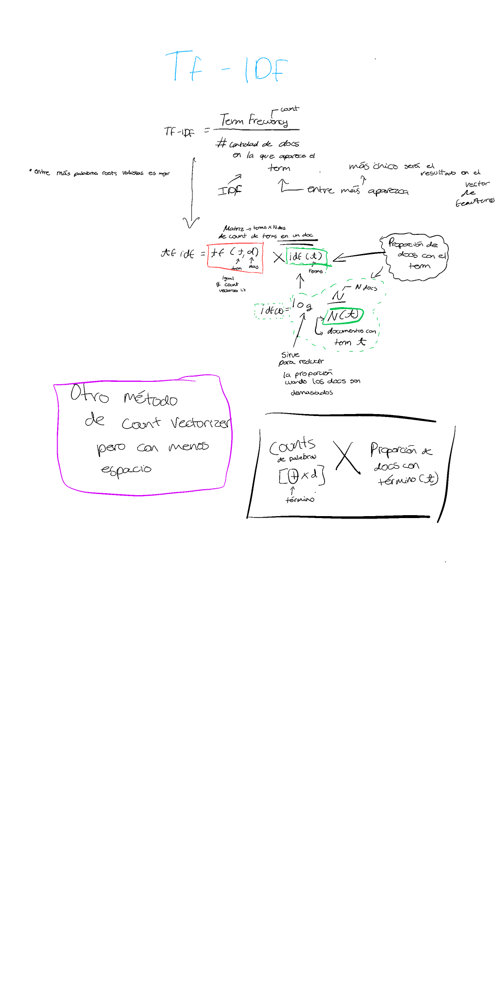

In [26]:

vectorizer = TfidfVectorizer()
import pickle
# Serialize the object and save it to a file
# with open('count_vectorizer.pkl', 'wb') as f:
#     pickle.dump(vectorizer, f)
X = vectorizer.fit_transform(corpus).toarray()
y = df["status"].values

In [27]:
# Train y test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=29)

# Entrenamiento de la RNN

Una red neuronal artificial (ANN, por sus siglas en inglés) es un modelo matemático y computacional que se inspira en la estructura y el funcionamiento del cerebro humano para procesar información. Consiste en un conjunto de nodos interconectados, conocidos como neuronas artificiales, que reciben una entrada de datos, realizan un cálculo y producen una salida.

Cada neurona en una ANN tiene un conjunto de entradas ponderadas que se suman y se pasan a través de una función de activación no lineal para generar la salida de la neurona. La red está organizada en capas, donde cada capa se compone de múltiples neuronas. La primera capa se llama capa de entrada, la última capa se llama capa de salida, y las capas intermedias se llaman capas ocultas.

El proceso de entrenamiento de una ANN implica ajustar los pesos y los sesgos de las conexiones entre las neuronas para minimizar una función de pérdida. Esto se realiza utilizando técnicas de aprendizaje supervisado o no supervisado, en función del tipo de problema que se esté abordando.

En este caso usaremos las herramientas de Tensor Flow para poder crear nuestra ANN

-  'units' se refiere al número de neuronas en la capa densa que se está agregando a la red neuronal. Es decir, esta capa tendrá 200 neuronas en total. El número de unidades en una capa densa es un parámetro que se puede ajustar para controlar la complejidad y la capacidad de aprendizaje de la red neuronal.  units se refiere al número de neuronas en la capa densa que se está agregando a la red neuronal. Es decir, esta capa tendrá 200 neuronas en total. El número de unidades en una capa densa es un parámetro que se puede ajustar para controlar la complejidad y la capacidad de aprendizaje de la red neuronal.

- 'activation'  se refiere a la función de activación que se utilizará en la capa densa que se está agregando a la red neuronal.

    - La función de activación es una función matemática que se aplica a la salida de cada neurona en una capa para introducir no linealidad en la red neuronal. La función relu (unidad lineal rectificada) es una función de activación comúnmente utilizada que retorna 0 si la entrada es negativa y la entrada misma si es positiva o cero.

    - La función relu se usa a menudo porque puede ayudar a prevenir el problema de la desaparición del gradiente en el entrenamiento de redes neuronales profundas, lo que puede ocurrir cuando se usan funciones de activación que tienen gradientes muy pequeños en ciertas regiones.

    - La función Softmax es una función de activación comúnmente utilizada en la capa de salida de una red neuronal para producir una distribución de probabilidad sobre varias clases. La función Softmax es especialmente útil en problemas de clasificación multiclase, donde se desea predecir la probabilidad de pertenencia a varias clases diferentes. Por ejemplo, en una red neuronal para clasificar imágenes, la función Softmax puede utilizarse para producir una distribución de probabilidad sobre varias categorías de objetos (por ejemplo, gatos, perros, aviones, etc.) basándose en las características de la imagen de entrada.

    - Existen otras funciones de activación comunes, como la función sigmoid, la función tanh, y la función softmax, cada una de las cuales se utiliza para diferentes propósitos según el problema específico de la red neuronal.

- 'optimizer' se refiere a la función de optimización para ajustar los pesos conforme a la taza de aprendizaje que se utilizará en la capa densa que se está agregando a la red neuronal.

In [1]:
import tensorflow as tf
ann = tf.keras.models.Sequential()
ann.add(tf.keras.layers.Dense(units=200, activation="relu"))
ann.add(tf.keras.layers.Dense(units=200, activation="relu")) 
ann.add(tf.keras.layers.Dense(units=200, activation="relu"))
ann.add(tf.keras.layers.Dense(units=2, activation="softmax"))
ann

In [2]:
# se usa sparse_categorical_crossentropy
ann.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

In [31]:
ann.fit(x=X_train, y=y_train, batch_size=32, epochs=50)

Epoch 1/50
5/5 [==============================] - 5s 144ms/step - loss: 0.6943 - accuracy: 0.5214
Epoch 2/50
5/5 [==============================] - 1s 138ms/step - loss: 0.6432 - accuracy: 0.9429
Epoch 3/50
5/5 [==============================] - 1s 142ms/step - loss: 0.5048 - accuracy: 0.9786
Epoch 4/50
5/5 [==============================] - 1s 153ms/step - loss: 0.2516 - accuracy: 1.0000
Epoch 5/50
5/5 [==============================] - 1s 141ms/step - loss: 0.0602 - accuracy: 1.0000
Epoch 6/50
5/5 [==============================] - 1s 138ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 7/50
5/5 [==============================] - 1s 138ms/step - loss: 6.5348e-04 - accuracy: 1.0000
Epoch 8/50
5/5 [==============================] - 1s 135ms/step - loss: 9.5675e-05 - accuracy: 1.0000
Epoch 9/50
5/5 [==============================] - 1s 138ms/step - loss: 2.5930e-05 - accuracy: 1.0000
Epoch 10/50
5/5 [==============================] - 1s 136ms/step - loss: 1.0404e-05 - accuracy: 1.0000
Epo

In [34]:
import numpy as np
#este
y_pred = ann.predict(X_test)
pred_class = np.argmax(y_pred, axis=-1) 
print(np.concatenate((pred_class.reshape(len(pred_class),1), y_test.reshape(len(y_test), 1)), axis=1))


2/2 [==============================] - 0s 7ms/step
[[0 0]
 [1 0]
 [0 1]
 [1 0]
 [1 0]
 [1 1]
 [0 1]
 [0 1]
 [1 0]
 [0 0]
 [0 0]
 [0 0]
 [1 0]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 1]
 [0 0]
 [0 0]
 [0 1]
 [0 1]
 [1 1]
 [1 1]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [0 1]
 [1 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 1]
 [0 1]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [1 0]
 [1 0]
 [0 1]
 [1 1]
 [1 0]
 [1 1]
 [1 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 1]
 [1 0]
 [1 1]]


In [35]:
np.mean(pred_class == y_test )

0.6333333333333333

In [36]:
history = ann.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))
test_loss, test_accuracy = ann.evaluate(X_test, y_test)
print('Test accuracy:', test_accuracy)

Epoch 1/10
5/5 [==============================] - 3s 704ms/step - loss: 1.7447e-06 - accuracy: 1.0000 - val_loss: 1.1601 - val_accuracy: 0.6333
Epoch 2/10
5/5 [==============================] - 1s 162ms/step - loss: 1.7294e-06 - accuracy: 1.0000 - val_loss: 1.1602 - val_accuracy: 0.6333
Epoch 3/10
5/5 [==============================] - 1s 158ms/step - loss: 1.7175e-06 - accuracy: 1.0000 - val_loss: 1.1603 - val_accuracy: 0.6333
Epoch 4/10
5/5 [==============================] - 1s 157ms/step - loss: 1.7064e-06 - accuracy: 1.0000 - val_loss: 1.1604 - val_accuracy: 0.6333
Epoch 5/10
5/5 [==============================] - 1s 144ms/step - loss: 1.6987e-06 - accuracy: 1.0000 - val_loss: 1.1605 - val_accuracy: 0.6333
Epoch 6/10
5/5 [==============================] - 1s 147ms/step - loss: 1.6800e-06 - accuracy: 1.0000 - val_loss: 1.1606 - val_accuracy: 0.6333
Epoch 7/10
5/5 [==============================] - 1s 147ms/step - loss: 1.6681e-06 - accuracy: 1.0000 - val_loss: 1.1607 - val_accuracy: